In [9]:
import pandas as pd

# Load the Excel file and sheet
file_path = 'neighbourhood-profiles-2021-158-model.xlsx'
sheet_name = 'hd2021_census_profile'
sheet_data = pd.read_excel(file_path, sheet_name=sheet_name, header=None)

# Extract headers from the first three rows
headers = sheet_data.iloc[0:3].T  # Transpose for better structuring
headers.columns = ["Neighborhood Name", "Neighborhood Number", "TSNS 2020 Designation"]

# Data starts from the 4th row
data = sheet_data.iloc[3:]

# Adjust headers to match the structure of the data
categories_header = ["Main/Subcategory"]
neighborhood_headers = headers["Neighborhood Name"].tolist()
corrected_headers = categories_header + neighborhood_headers

# Assign headers to the data
data.columns = corrected_headers[:len(data.columns)]  # Align header length with the data

# Identify main categories and subcategories
data['Is_Main_Category'] = data["Main/Subcategory"].apply(
    lambda x: not x.startswith(" ") if isinstance(x, str) else False
)

# Group data into DataFrames by main categories
grouped_dataframes = {}
current_category = None
current_df = None

for _, row in data.iterrows():
    if row["Is_Main_Category"]:
        # Save the previous main category's DataFrame
        if current_category and current_df is not None:
            grouped_dataframes[current_category] = current_df.reset_index(drop=True)
        
        # Initialize a new DataFrame for the new main category
        current_category = row["Main/Subcategory"]
        current_df = pd.DataFrame(columns=data.columns[1:-1])  # Exclude "Main/Subcategory" and "Is_Main_Category"
    else:
        # Append subcategory row to the current DataFrame
        current_df = pd.concat([current_df, row[1:-1].to_frame().T])  # Exclude "Main/Subcategory" and "Is_Main_Category"

# Save the final category's DataFrame
if current_category and current_df is not None:
    grouped_dataframes[current_category] = current_df.reset_index(drop=True)

# Display the list of main categories
list(grouped_dataframes.keys())


C:\Users\aaron\AppData\Local\Temp\ipykernel_8924\2907973832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Is_Main_Category'] = data["Main/Subcategory"].apply(


['Total - Age groups of the population - 25% sample data',
 'Total - Distribution (%) of the population by broad age groups - 25% sample data',
 'Average age of the population',
 'Median age of the population',
 'Total - Persons in private households - 25% sample data',
 'Number of persons in private households',
 'Total - Marital status for the total population aged 15 years and over - 25% sample data',
 'Total - Income statistics in 2020 for the population aged 15 years and over in private households - 25% sample data',
 'Composition of total income in 2020 of the population aged 15 years and over in private households (%) - 25% sample data',
 'Total - Total income groups in 2020 for the population aged 15 years and over in private households - 25% sample data',
 'Total - After-tax income groups in 2020 for the population aged 15 years and over in private households - 25% sample data',
 'Total - Employment income groups in 2020 for the population aged 15 years and over in private hou

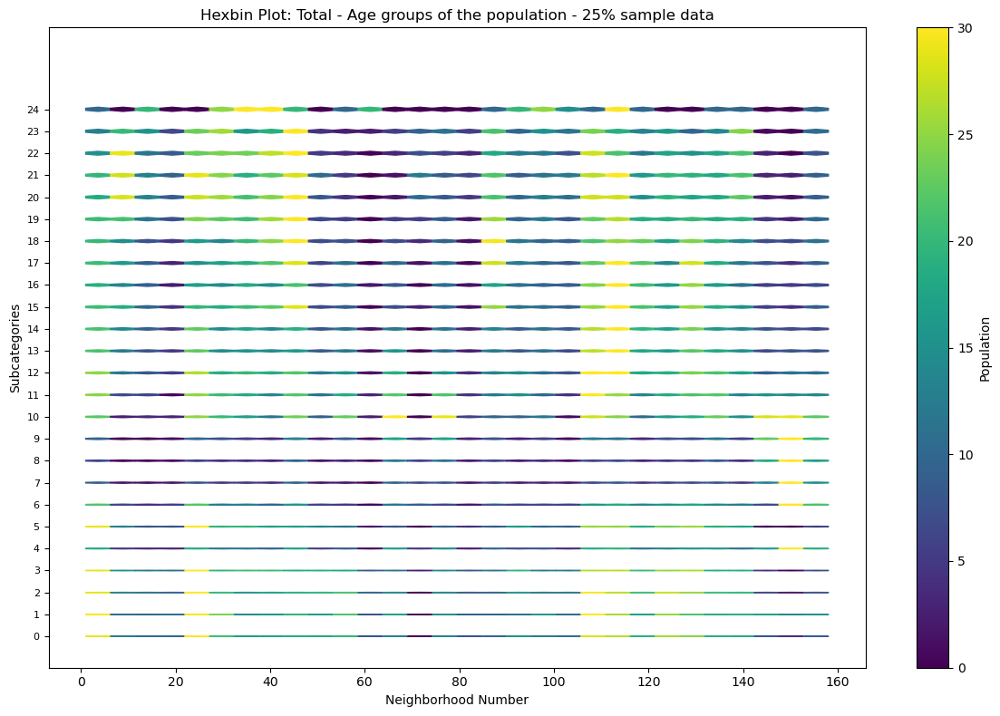

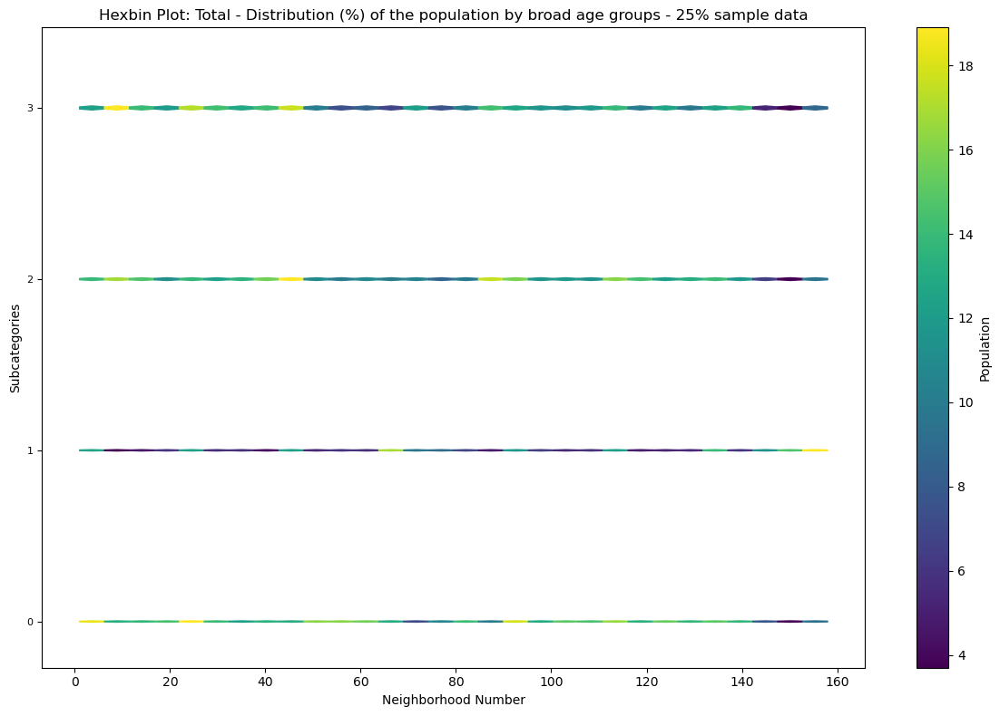

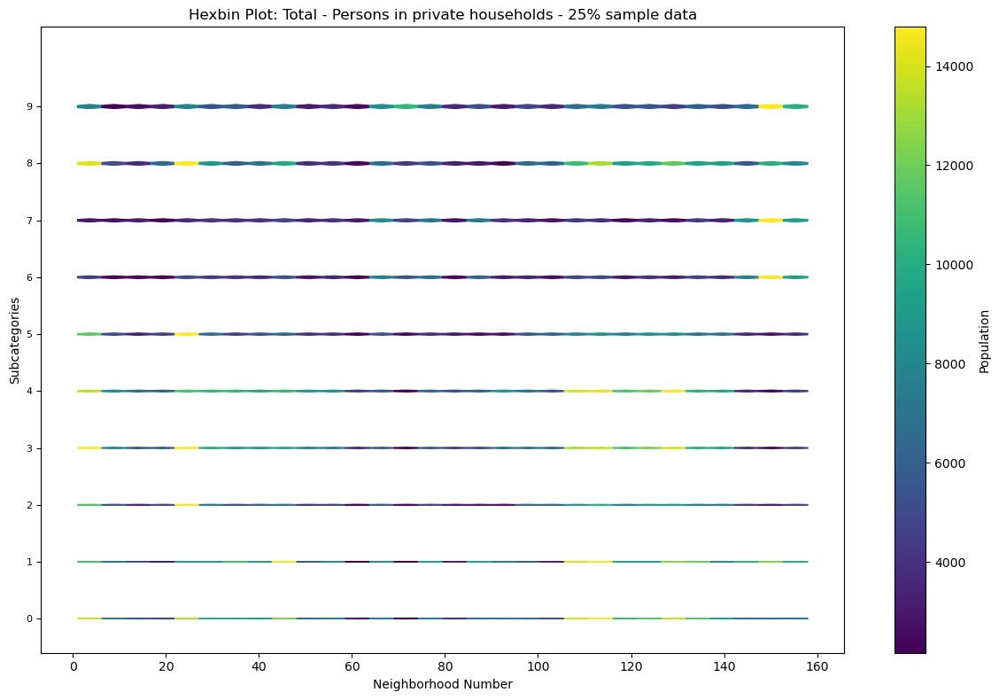

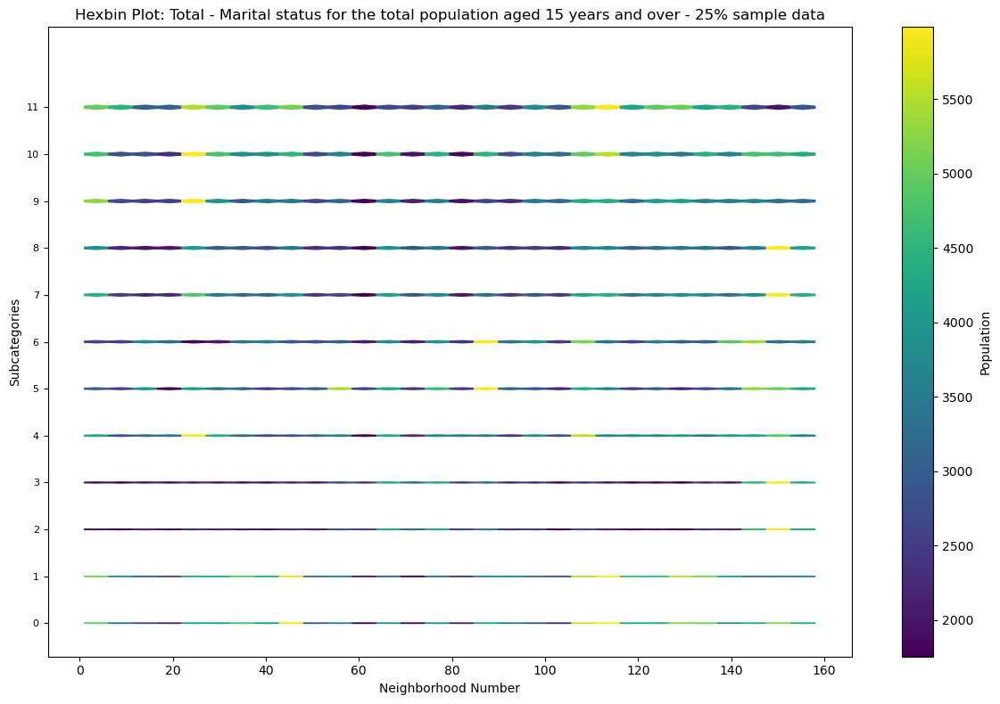

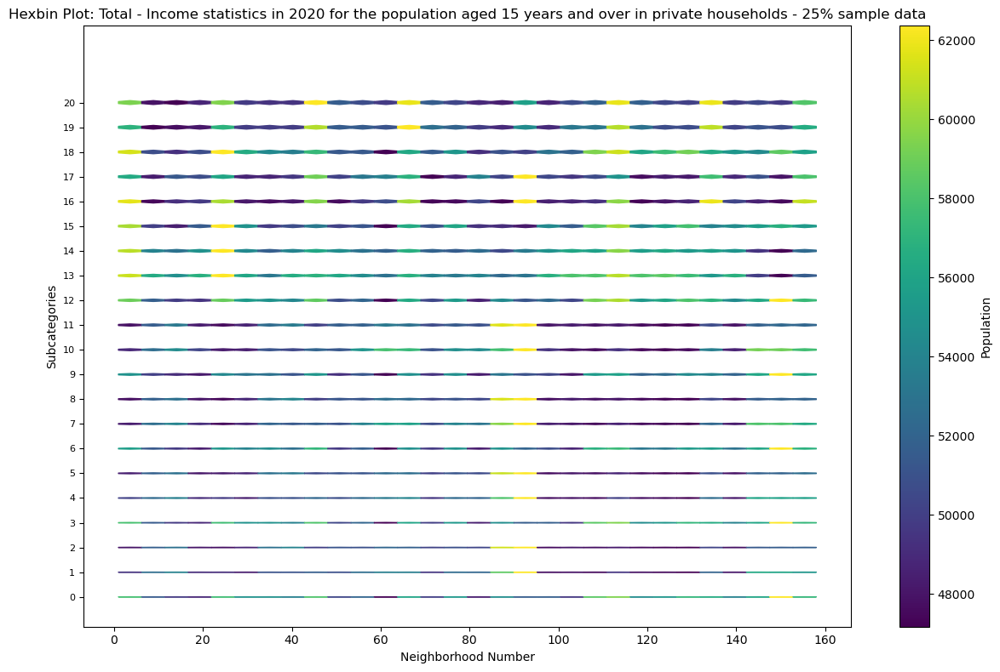

...

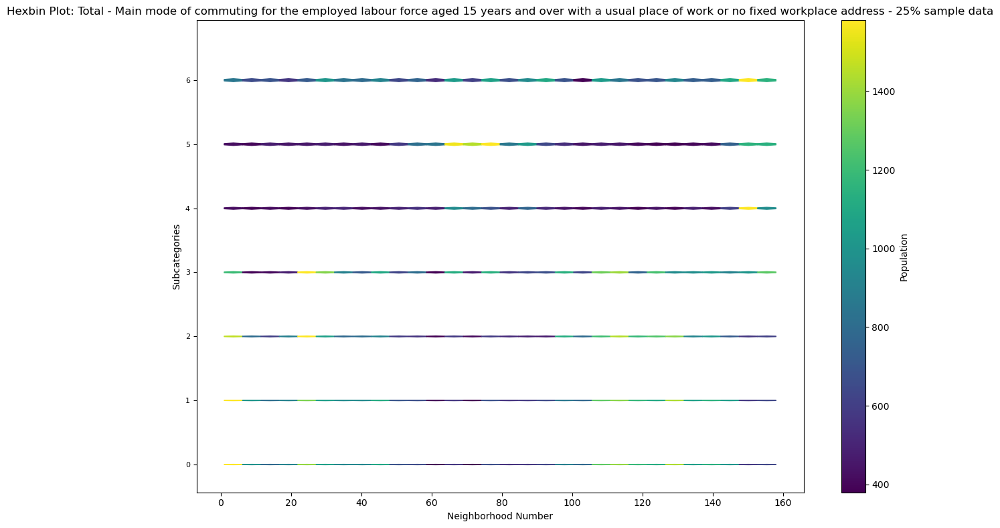

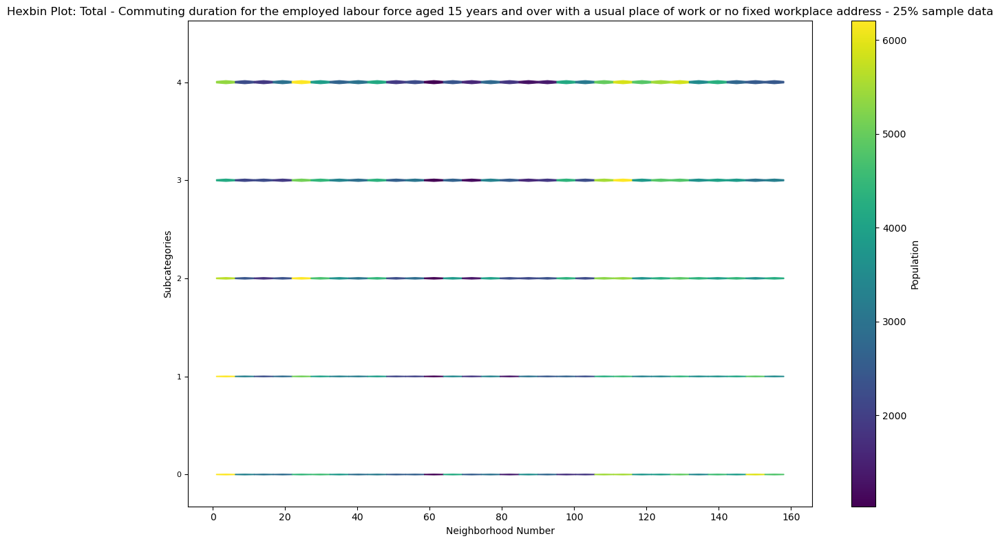

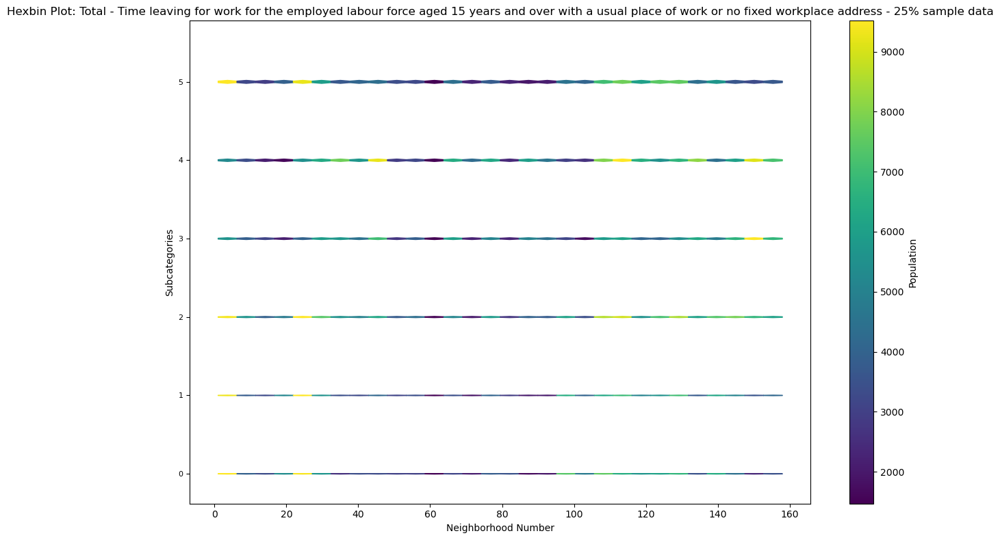

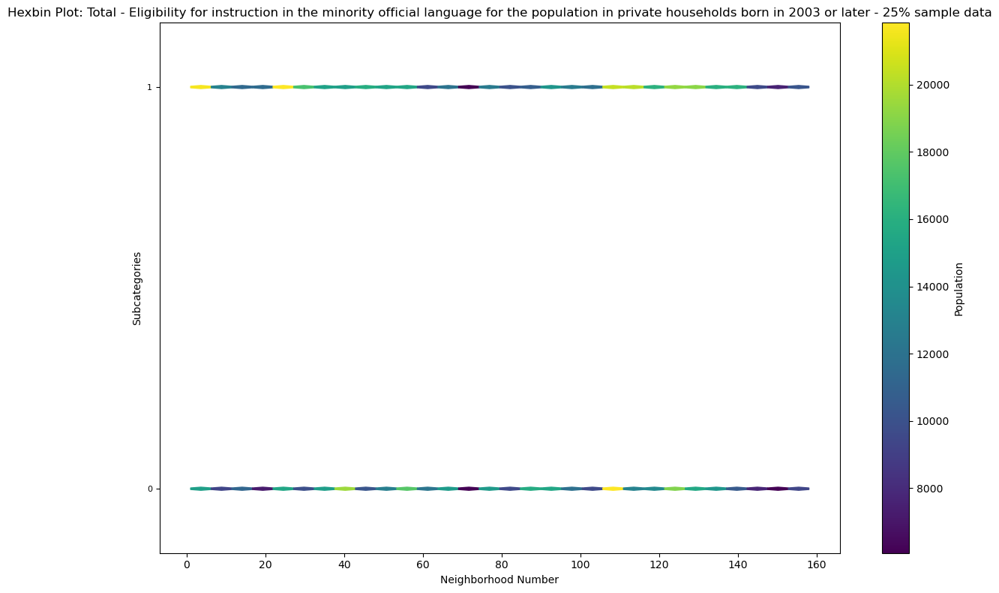

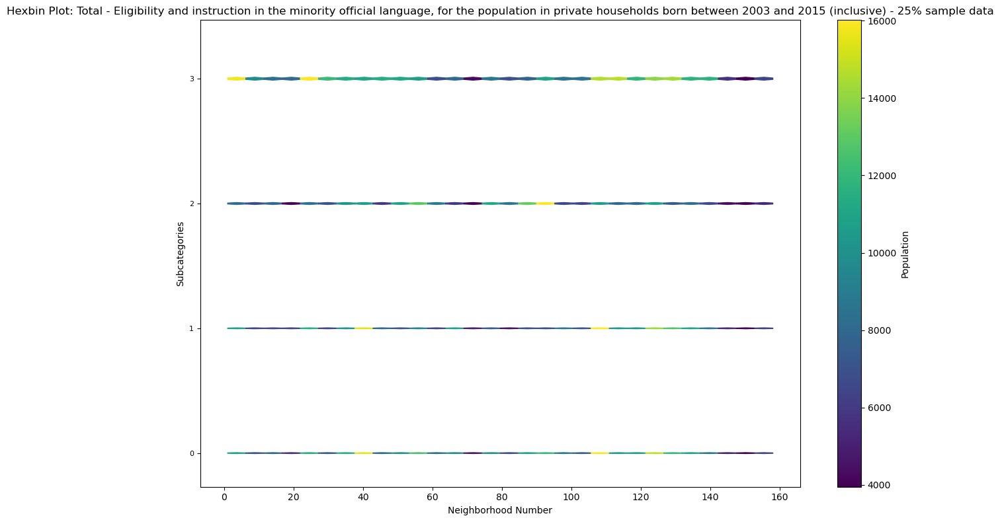

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate through all main categories and create hexbin plots
for category, df in grouped_dataframes.items():
    # Skip categories without subcategory data
    if df.empty:
        continue

    # Ensure numeric data and proper formatting
    df_numeric = df.apply(pd.to_numeric, errors='coerce').fillna(0)
    neighborhood_numbers = list(range(1, df_numeric.shape[1] + 1))  # Neighborhood numbers

    # Create a hexbin plot for this main category
    plt.figure(figsize=(12, 8))
    for i, subcategory in enumerate(df_numeric.index):
        plt.hexbin(neighborhood_numbers, [i] * len(neighborhood_numbers),
                   C=df_numeric.iloc[i, :],
                   gridsize=30, cmap='viridis', reduce_C_function=np.sum)
    
    # Set y-ticks to subcategory labels
    plt.yticks(ticks=range(len(df_numeric.index)), labels=df_numeric.index, fontsize=8)
    
    # Set plot title and labels
    plt.title(f"Hexbin Plot: {category}", fontsize=12)
    plt.xlabel("Neighborhood Number", fontsize=10)
    plt.ylabel("Subcategories", fontsize=10)
    plt.colorbar(label="Population")
    plt.tight_layout()
    
    # Show the plot
    plt.show()===
